In [14]:
import cv2

from xview3.constants import NODATA_VH_DB
import numpy as np
from xview3 import read_tiff
import albumentations as A
import matplotlib.pyplot as plt

#ch1_fname = "../data/tiny/train/05bc615a9b0e1159t/VH_dB.tif"
#ch2_fname = "../data/tiny/train/05bc615a9b0e1159t/VV_dB.tif"

ch1_fname = "../data/tiny/train/72dba3e82f782f67t/VH_dB.tif"
ch2_fname = "../data/tiny/train/72dba3e82f782f67t/VV_dB.tif"

image = np.dstack([read_tiff(ch1_fname), read_tiff(ch2_fname)])
image = A.CenterCrop(1536, 2048)(image=image)["image"]
image[10:20,10:20] = float("nan")
vv,vh = image[..., 0], image[..., 1]

<ipython-input-15-277f77f84ffc>:9: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



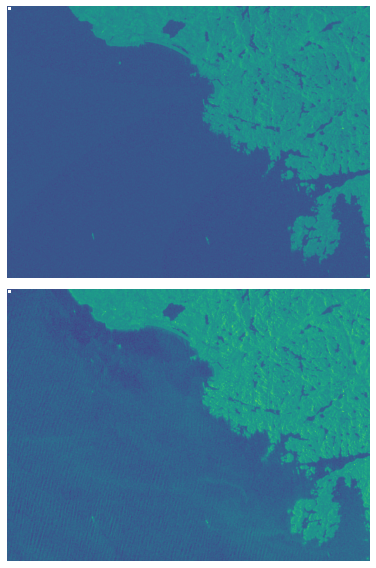

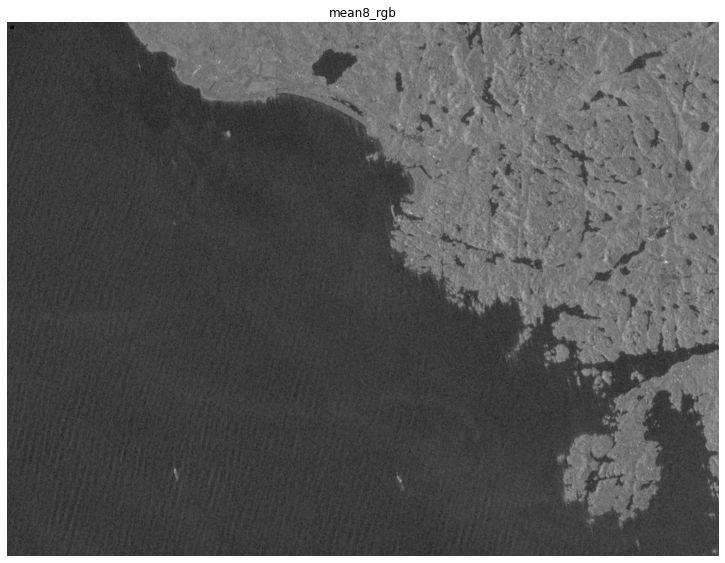

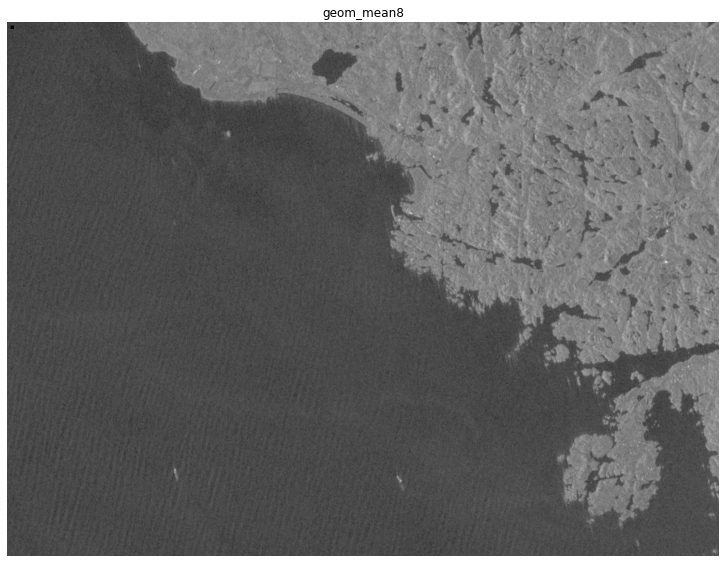

In [15]:
from xview3 import pseudocolor_heatmap

f, ax = plt.subplots(2,1,figsize=(16,8))
ax[0].imshow(vv)
ax[0].axis('off')
ax[1].imshow(vh)
ax[1].axis('off')
f.tight_layout()
f.show()

# %%

def unit_normalization(x):
    xmin = np.nanmin(x)
    xmax = np.nanmax(x)
    return (x - xmin)/(xmax-xmin)

# %%
import  cv2


mean = (vv + vh) * 0.5
geom_mean = np.sqrt(unit_normalization(vv) * unit_normalization(vh))

geom_mean8 = cv2.normalize(geom_mean, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
mean8 = cv2.normalize(mean, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

mean8_rgb = cv2.cvtColor(mean8, cv2.COLOR_GRAY2RGB)

plt.figure(figsize=(16,8))
plt.imshow(mean8_rgb)
plt.tight_layout()
plt.axis('off')
plt.title('mean8_rgb')
plt.show()

plt.figure(figsize=(16,8))
plt.imshow(cv2.cvtColor(geom_mean8, cv2.COLOR_GRAY2RGB))
plt.tight_layout()
plt.axis('off')
plt.title('geom_mean8')
plt.show()

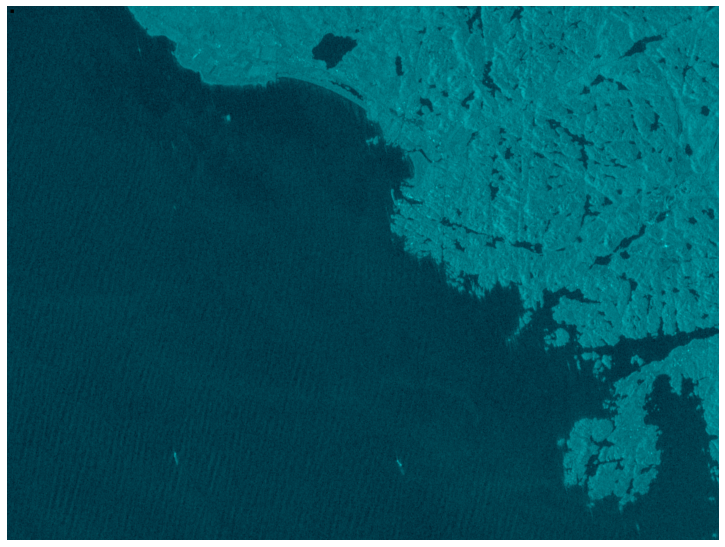

In [16]:
zeros = np.zeros_like(geom_mean8)
image = np.dstack((zeros, mean8, geom_mean8))
plt.figure(figsize=(16,8))
plt.imshow(image)
plt.tight_layout()
plt.axis('off')
plt.show()

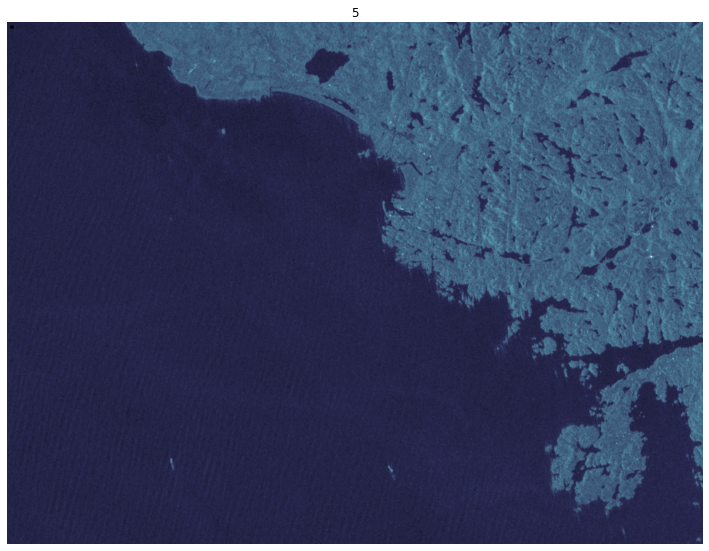

In [17]:
geom_mean8_rgb = cv2.cvtColor(geom_mean8, cv2.COLOR_GRAY2RGB)

for cmap in [
    cv2.COLORMAP_OCEAN ,
]:
    mean8_jet = cv2.applyColorMap(geom_mean8, cmap)[..., ::-1]
    plt.figure(figsize=(16,8))
    plt.imshow(mean8_jet//2 + geom_mean8_rgb//2)
    plt.title(str(cmap))
    plt.tight_layout()
    plt.axis('off')
    plt.show()

In [18]:
def image_hist(vv,vh):

    f, ax = plt.subplots(2,2,figsize=(16,10),gridspec_kw={'height_ratios': [4, 1]})

    ax[0,0].imshow(vv)
    ax[0,0].axis('off')
    ax[0,0].set_title('vv')

    ax[1,0].hist(vv.reshape(-1), vv.shape[1])
    ax[1,0].axis('on')

    ax[0,1].imshow(vh)
    ax[0,1].axis('off')
    ax[0,1].set_title('vh')

    ax[1,1].hist(vh.reshape(-1), vh.shape[1])
    ax[1,1].axis('on')

    f.tight_layout()
    f.show()

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



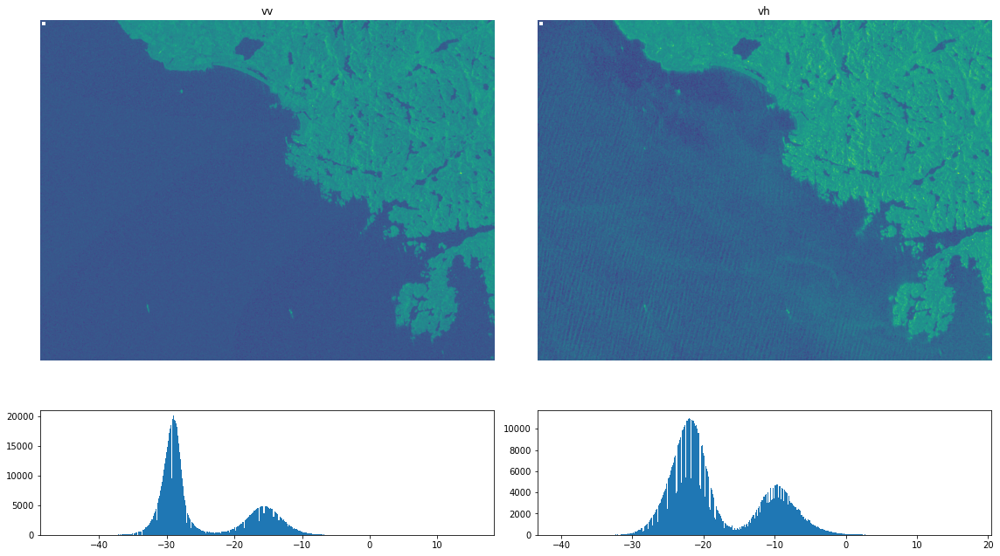

In [19]:
image_hist(vv,vh)

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



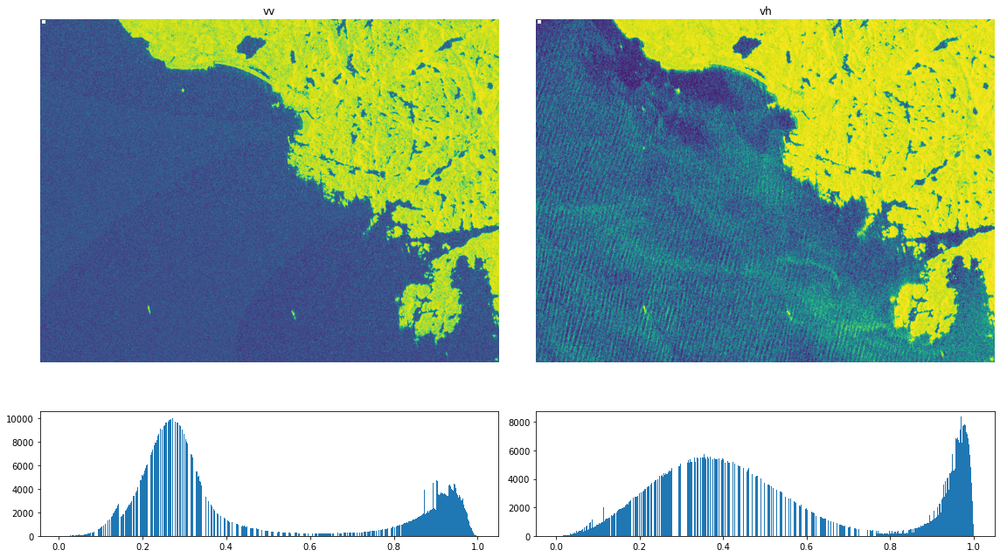

In [46]:
import torch

def sigmoid_normalization(x, midpoint=-20, temperature=0.18):
    x = torch.from_numpy(x)
    xs = (x - midpoint) * temperature
    return xs.sigmoid().numpy()

image_hist(sigmoid_normalization(vv, midpoint=-25, temperature=0.25),
           sigmoid_normalization(vh, midpoint=-20, temperature=0.3))

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



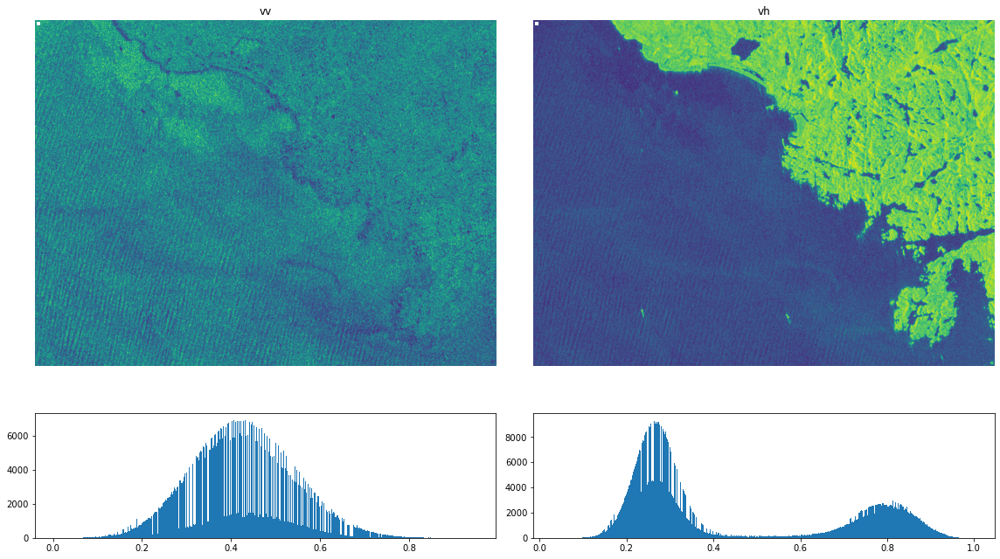

In [21]:
image_hist(sigmoid_normalization(vv-vh,midpoint=-5),
           sigmoid_normalization((vh + vv)*0.5))

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



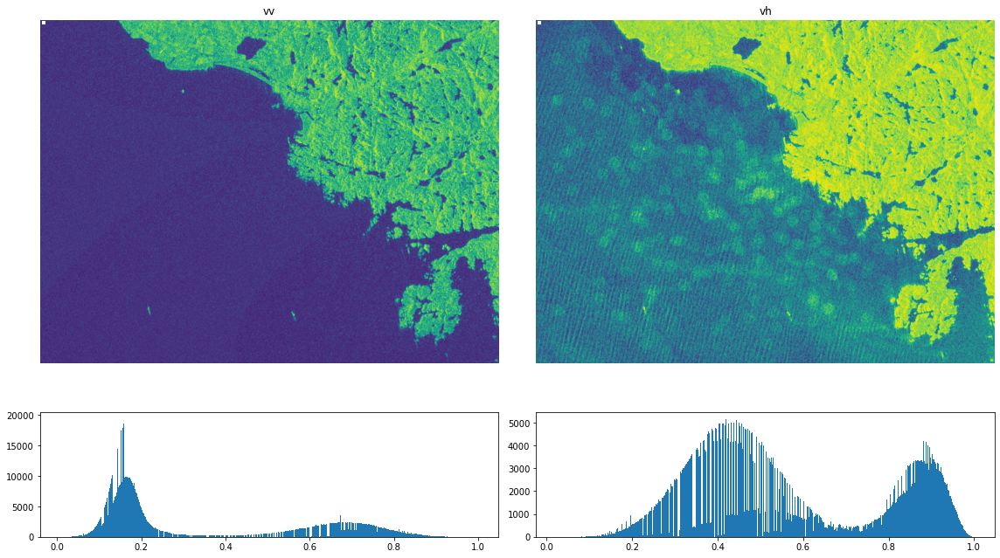

In [22]:
import random
import numpy as np

@A.preserve_shape
def sar_add_fog(img, fog_coef, alpha_coef, haze_list):

    width = img.shape[1]

    hw = max(int(width // 3 * fog_coef), 10)

    for haze_points in haze_list:
        x, y = haze_points
        overlay = img.copy()
        output = img.copy()
        alpha = alpha_coef * fog_coef
        rad = hw // 2
        point = (x + hw // 2, y + hw // 2)
        cv2.circle(overlay, point, int(rad), (255, 255, 255), -1)
        cv2.addWeighted(overlay, alpha, output, 1 - alpha, 0, output)

        img = output.copy()

    #image_rgb = cv2.blur(img, (hw // 10, hw // 10))
    return img

class SARRandomFog(A.ImageOnlyTransform):
    def __init__(
        self,
        fog_coef_lower=0.003,
        fog_coef_upper=0.1,
        alpha_coef=0.08,
        always_apply=False,
        p=0.5,
    ):
        super(SARRandomFog, self).__init__(always_apply, p)

        if not 0 <= fog_coef_lower <= fog_coef_upper <= 1:
            raise ValueError(
                "Invalid combination if fog_coef_lower and fog_coef_upper. Got: {}".format(
                    (fog_coef_lower, fog_coef_upper)
                )
            )
        if not 0 <= alpha_coef <= 1:
            raise ValueError("alpha_coef must be in range [0, 1]. Got: {}".format(alpha_coef))

        self.fog_coef_lower = fog_coef_lower
        self.fog_coef_upper = fog_coef_upper
        self.alpha_coef = alpha_coef

    def apply(self, image, fog_coef=0.1, haze_list=(), **params):
        return sar_add_fog(image, fog_coef, self.alpha_coef, haze_list)

    @property
    def targets_as_params(self):
        return ["image"]

    def get_params_dependent_on_targets(self, params):
        img = params["image"]
        fog_coef = random.uniform(self.fog_coef_lower, self.fog_coef_upper)

        height, width = imshape = img.shape[:2]

        hw = max(1, int(width // 3 * fog_coef))

        haze_list = []
        midx = width // 2 - 2 * hw
        midy = height // 2 - hw
        index = 1

        while midx > -hw or midy > -hw:
            for _i in range(hw // 10 * index):
                x = random.randint(midx, width - midx - hw)
                y = random.randint(midy, height - midy - hw)
                haze_list.append((x, y))

            midx -= 3 * hw * width // sum(imshape)
            midy -= 3 * hw * height // sum(imshape)
            index += 1

        return {"haze_list": haze_list, "fog_coef": fog_coef}

    def get_transform_init_args_names(self):
        return ("fog_coef_lower", "fog_coef_upper", "alpha_coef")

fog = SARRandomFog(p=1)
image_hist(sigmoid_normalization(fog(image=vv)["image"]),
           sigmoid_normalization(fog(image=vh)["image"]))

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



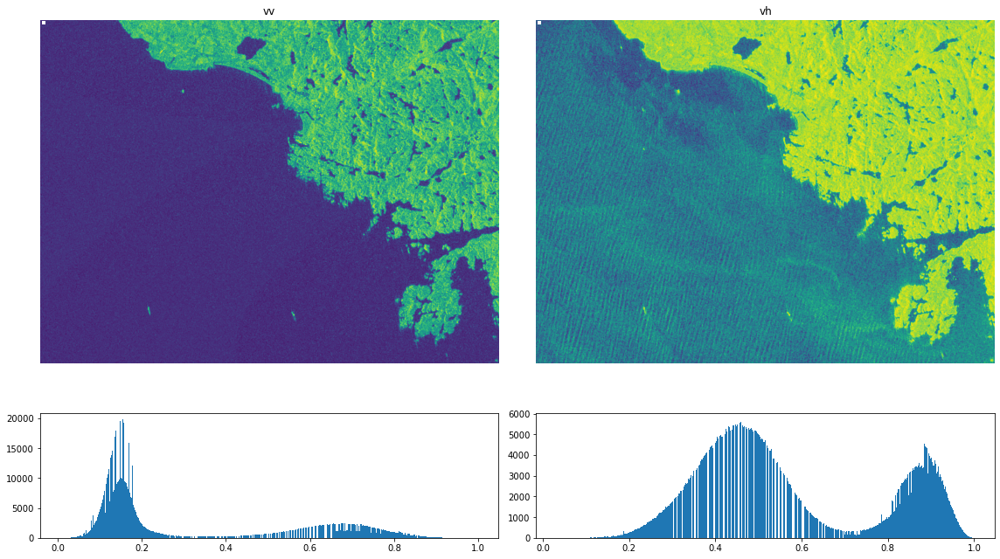

In [23]:
from xview3.augmentations import UnclippedRandomBrightnessContrast
aug = UnclippedRandomBrightnessContrast(
    brightness_limit=(-0.1,0.1),
    contrast_limit=0.1,
    p=1,
    image_in_log_space=False)

# %%
image_hist(sigmoid_normalization(aug(image=vv)["image"]),
           sigmoid_normalization(aug(image=vh)["image"]))

<ipython-input-5-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



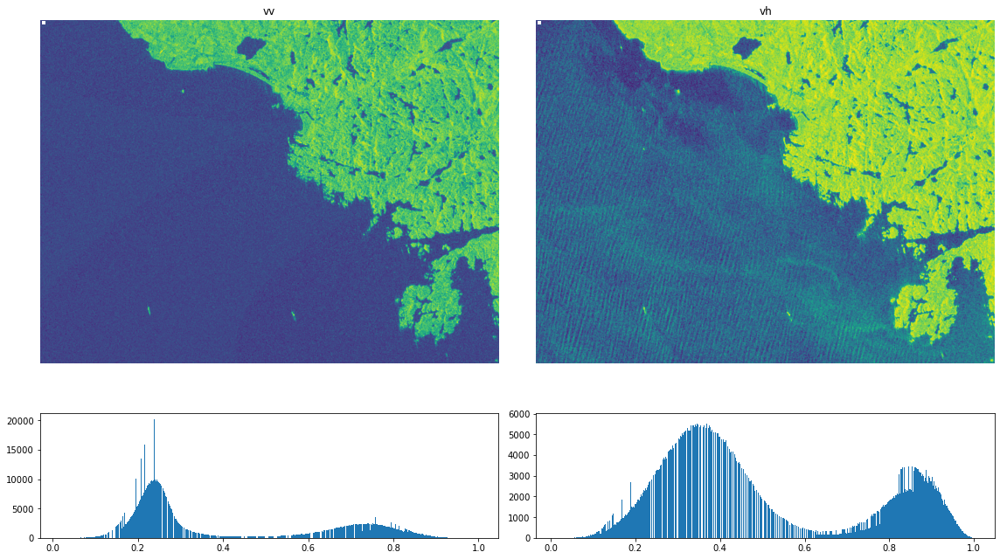

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



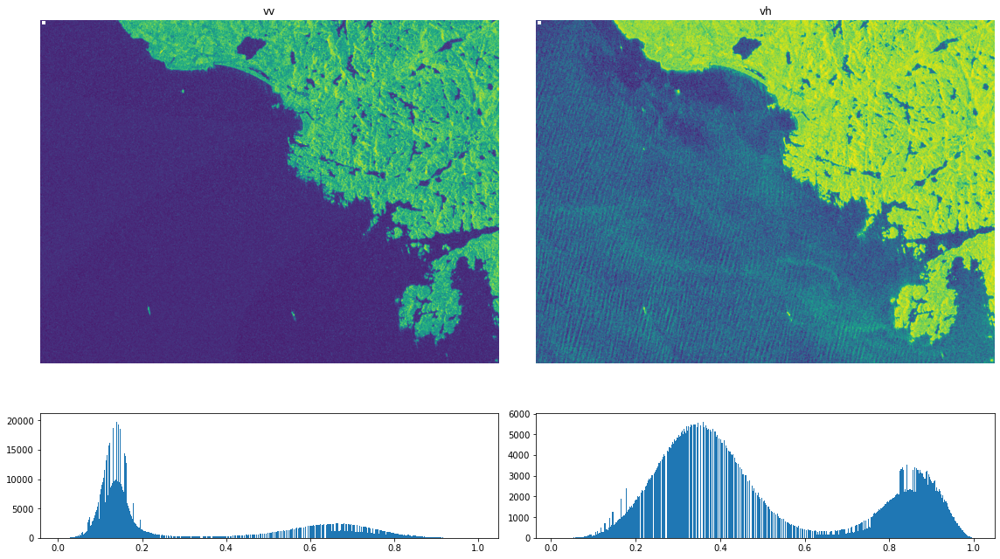

In [24]:
image_hist(sigmoid_normalization(aug(image=vv)["image"]),
           sigmoid_normalization(aug(image=vh)["image"]))

<ipython-input-5-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



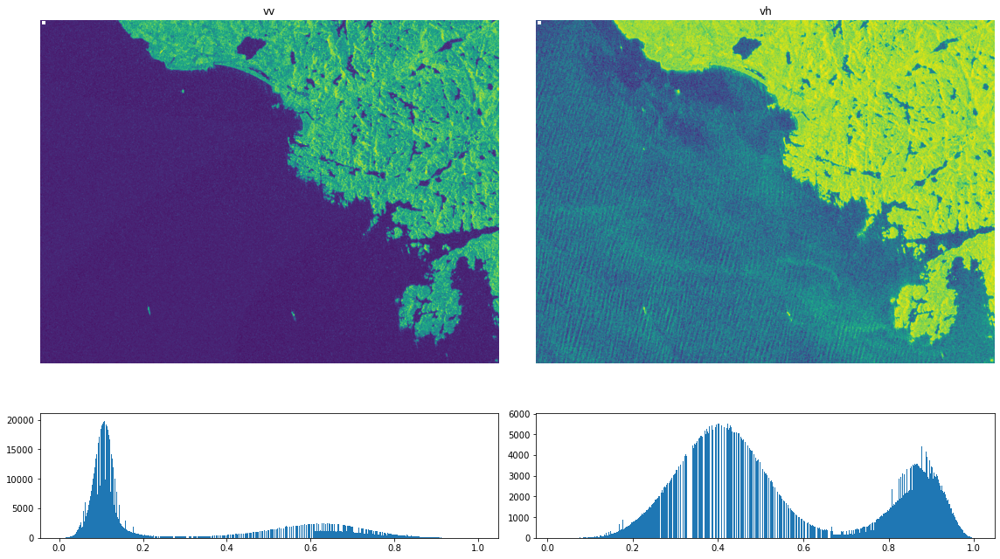

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



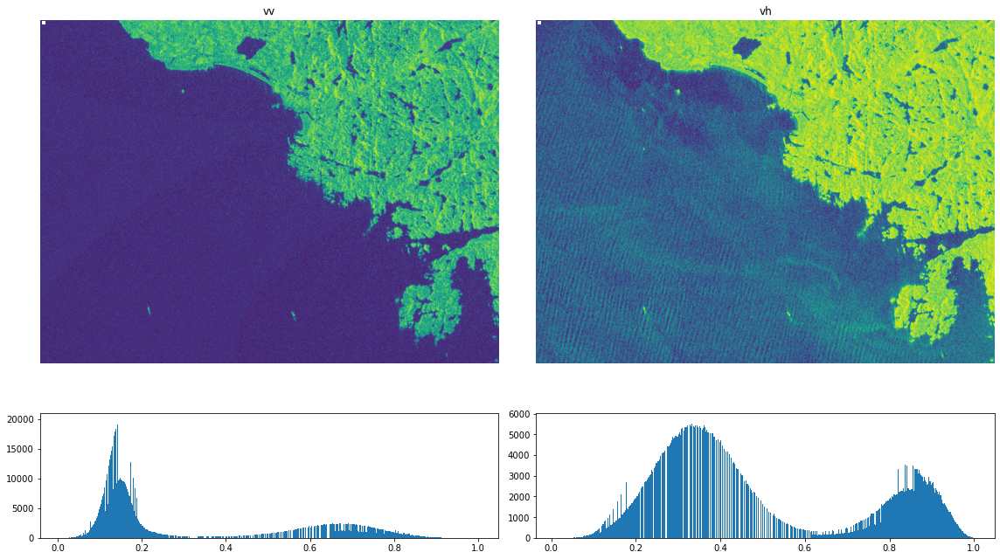

In [25]:
image_hist(sigmoid_normalization(aug(image=vv)["image"]),
           sigmoid_normalization(aug(image=vh)["image"]))

<ipython-input-5-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



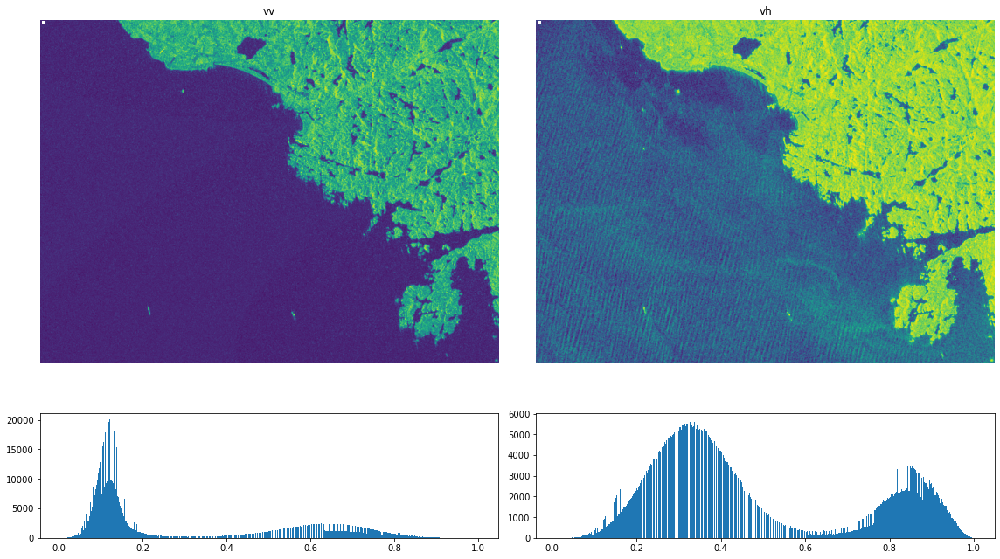

<ipython-input-18-fc2f55488654>:20: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



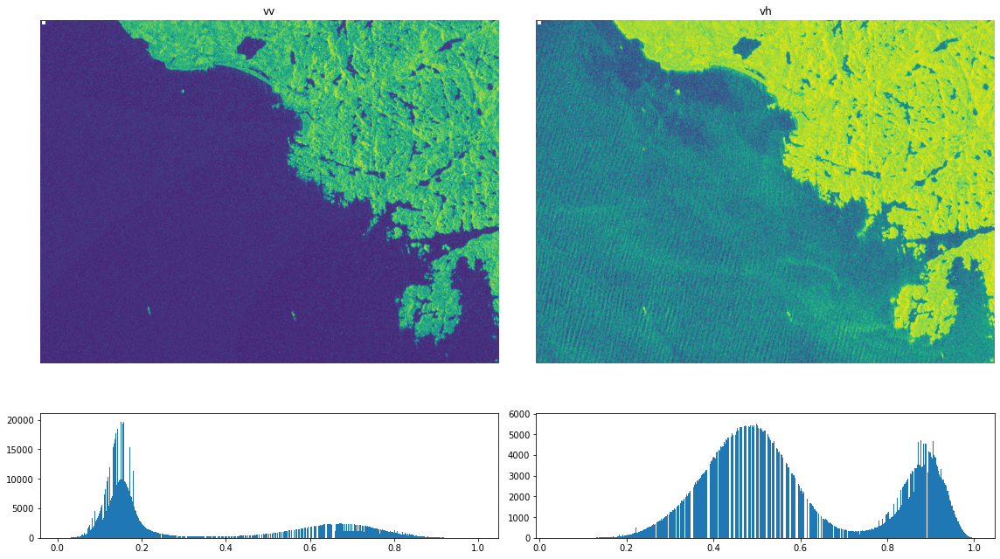

In [26]:
image_hist(sigmoid_normalization(aug(image=vv)["image"]),
           sigmoid_normalization(aug(image=vh)["image"]))
